In [28]:
import sys,os,argparse,time
import numpy as np
import torch
import utils
from datetime import datetime
import pickle
import pandas as pd
tstart=time.time()
import matplotlib.pyplot as plt 
from tabulate import tabulate
from prettytable import PrettyTable


In [29]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [30]:
# Arguments
parser=argparse.ArgumentParser(description='xxx')
parser.add_argument('--seed',               default=0,              type=int,     help='(default=%(default)d)')
parser.add_argument('--device',             default='cpu',          type=str,     help='gpu id')
parser.add_argument('--experiment',         default='1_task_groups',       type =str,    help='Mnist or dissertation')
parser.add_argument('--approach',           default='PUGCL',          type =str,    help='Method, always Lifelong Uncertainty-aware learning')
parser.add_argument('--data_path',          default='data/data_test.csv',     type=str,     help='gpu id')

# Training parameters
parser.add_argument('--output',             default='',             type=str,     help='')
parser.add_argument('--checkpoint_dir',     default='../checkpoints_1_tasks',    type=str,   help='')
parser.add_argument('--n_epochs',           default=100,              type=int,     help='')
parser.add_argument('--batch_size',         default=64,             type=int,     help='')
parser.add_argument('--lr',                 default=0.03,           type=float,   help='')
parser.add_argument('--hidden_size',        default=800,           type=int,     help='')
parser.add_argument('--parameter',          default='',             type=str,     help='')

# UCB HYPER-PARAMETERS
parser.add_argument('--MC_samples',         default='10',           type=int,     help='Number of Monte Carlo samples')
parser.add_argument('--rho',                default='-3',           type=float,   help='Initial rho')
parser.add_argument('--sigma1',             default='0.0',          type=float,   help='STD foor the 1st prior pdf in scaled mixture Gaussian')
parser.add_argument('--sigma2',             default='6.0',          type=float,   help='STD foor the 2nd prior pdf in scaled mixture Gaussian')
parser.add_argument('--pi',                 default='0.25',         type=float,   help='weighting factor for prior')

parser.add_argument('--resume',             default='no',           type=str,     help='resume?')
parser.add_argument('--sti',                default=1,              type=int,     help='starting task?')

parser.add_argument("-f", "--fff", help="a dummy argument to fool ipython", default="1")

args=parser.parse_args()
utils.print_arguments(args)

Arguments =
	seed: 0
	device: cpu
	experiment: 1_task_groups
	approach: PUGCL
	data_path: data/data_test.csv
	output: 
	checkpoint_dir: ../checkpoints_1_tasks
	n_epochs: 100
	batch_size: 64
	lr: 0.03
	hidden_size: 800
	parameter: 
	MC_samples: 10
	rho: -3.0
	sigma1: 0.0
	sigma2: 6.0
	pi: 0.25
	resume: no
	sti: 1
	fff: /Users/jonastjomsland/Library/Jupyter/runtime/kernel-56c2a18d-52bb-44e2-ba8c-342e61bb1908.json


In [31]:
# Set seed for stable results
#np.random.seed(args.seed)
#torch.manual_seed(args.seed)

# Check if Cuda is available
if torch.cuda.is_available():
    torch.cuda.manual_seed(args.seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

print("Using device:", args.device)

# PUGCL with two tasks:
from data import dataloader_1_tasks as dataloader

# Import Lifelong Uncertainty-aware Learning approach:
#from bayesian_model.lul import Lul
from training_method import PUGCL

# Import model used:
#from bayesian_model.bayesian_network import BayesianNetwork
from bayesian_model.bayesian_network2 import BayesianNetwork

# Load training data:
print("Loading data...")
data, task_outputs, input_size = dataloader.get(data_path=args.data_path)
print("Input size =", input_size, "\nTask info =", task_outputs)
print("Number of data samples: ", len(data[0]['train']['x']))
args.num_tasks = len(task_outputs)
args.input_size = input_size
args.task_outputs = task_outputs

# Used to load best model:
args.approach = 'PUGCL_final'

# Hardcode hidden size from parameter search:
args.hidden_size = 800

# Checkpoint for this run
checkpoint = utils.make_directories(args)
args.checkpoint = checkpoint
print(checkpoint)

# Initialize Bayesian network
print("Initializing network...")
model = BayesianNetwork(args).to(args.device)

# Initialize Lul approach
print("Initialize Lifelong Uncertainty-aware Learning")
approach = PUGCL(model, args=args)
print("-"*100)

# Load stored model:
model_number = 0
checkpoint = torch.load(os.path.join(args.checkpoint, 'model_{}.pth.tar'.format(model_number)), map_location=torch.device('cpu'))
model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(device=args.device).eval()

Using device: cpu
Loading data...
Input size = [1, 29] 
Task info = [(0, 32)]
Number of data samples:  1483
Results will be saved in  ../checkpoints_1_tasks/1_task_groups_PUGCL_final
../checkpoints_1_tasks/1_task_groups_PUGCL_final
Initializing network...
Initialize Lifelong Uncertainty-aware Learning
----------------------------------------------------------------------------------------------------


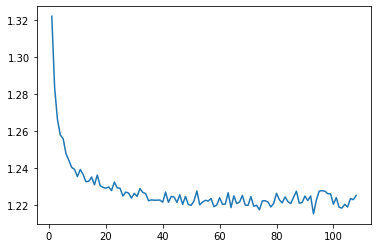

In [45]:
# Load loss dict:
with open("../checkpoints/1_task_UCB/loss_dict_1_task_UCB.p", "rb") as f:
    loss_dict = pickle.load(f)

plt.figure()
plt.plot(np.arange(1,len(loss_dict[0])+1),loss_dict[0])
plt.show()

In [5]:
# Load features:
df_x1 = pd.read_csv('/Users/jonastjomsland/Dissertation/scripts_and_data/features4.csv')
df_x1 = df_x1.iloc[:, :-1]
df_x2 = pd.read_csv('/Users/jonastjomsland/Dissertation/data/features5.csv', sep=';')
df_x2.columns = df_x2.iloc[0]
df_x2 = df_x2.drop(df_x2.index[0])
df_x2 = df_x2.iloc[:, :-1]

features = pd.concat([df_x1, df_x2])
features = features.iloc[:-40,:-12]
features['Stamp'] = features['Stamp'].astype(int)


In [6]:
# Load test data:
full_set = pd.read_csv(args.data_path)
full_set['Stamp'] = full_set['Stamp'].astype(int)
# Split in circle and arrow
df_circle = full_set[full_set['Using circle'] == 1]
df_arrow = full_set[full_set['Using circle'] == 0]
actions = [['Vacuum cleaning', 'Mopping the floor', 'Carry warm food', 'Carry cold food', 'Carry drinks', 'Carry small objects (plates, toys)', 'Carry big objects (tables, chairs)', 'Cleaning (Picking up stuff)'], ['Vacuum cleaning', 'Mopping the floor', 'Carry warm food', 'Carry cold food', 'Carry drinks', 'Carry small objects (plates, toys)', 'Carry big objects (tables, chairs)', 'Starting conversation']]


In [7]:
# Do 100 MC samples of inference 
x_circle = torch.tensor(df_circle.iloc[:,0:30].drop_duplicates().values).type(torch.float32)
x_arrow = torch.tensor(df_arrow.iloc[:,0:30].drop_duplicates().values).type(torch.float32)
test_scenes = [[df_circle.iloc[:,0:30].drop_duplicates().Stamp.values][0], [df_arrow.iloc[:,0:30].drop_duplicates().Stamp.values][0]]
# Dict for model output
model_output = {}
first_it = True
for sample in range(100):
    output_circle = model(x_circle[:,1:], sample = True, sample_last_layer = True)[0][:,0:16]
    output_arrow = model(x_arrow[:,1:], sample = True, sample_last_layer = True)[0][:,16:]
    # Append output
    # Circle actions
    if first_it:
        model_output[0] = output_circle.detach().numpy()
    else:
        model_output[0] = np.dstack([model_output[0],output_circle.detach().numpy()])
    # Arrow actions
    if first_it:
        model_output[1] = output_arrow.detach().numpy()
    else:
        model_output[1] = np.dstack([model_output[1],output_arrow.detach().numpy()])
    first_it = False
print(model_output[0].shape)
print(model_output[1].shape)

(41, 16, 100)
(59, 16, 100)


In [8]:
evaluation_dict = {}
for action_index, action_type in enumerate(test_scenes):
    for scene_index, scene in enumerate(action_type):
        evaluation_dict[scene] = {}
        # Scene stamp for image
        evaluation_dict[scene]['Stamp'] = scene
        
        # Features of the scene
        evaluation_dict[scene]['Features'] = features[features.Stamp == scene].values[0][2:].astype(float)
        # Actions for that scene
        evaluation_dict[scene]['Actions'] = actions[int(evaluation_dict[scene]['Features'][1])]
        
        # Using circle or arrow
        if evaluation_dict[scene]['Features'][0] == 1:
            # Scene is with circle
            evaluation_dict[scene]['Using circle'] = True
            scene_df = df_circle[df_circle.Stamp == scene]
        else:
            evaluation_dict[scene]['Using circle'] = False
            scene_df = df_arrow[df_arrow.Stamp == scene]
        
        # Labeled answers
        evaluation_dict[scene]['Mean label'] = scene_df.mean(axis = 0).values[30:]
        evaluation_dict[scene]['Variance in labels'] = scene_df.var(axis = 0).values[30:]
        
        # Predicted values:
        evaluation_dict[scene]['Predicted mean'] = []
        evaluation_dict[scene]['Aleatoric uncertainty'] = []
        evaluation_dict[scene]['Epistemic uncertainty'] = []

        mean = model_output[action_index][scene_index, 0:8, :]
        variance = np.exp(model_output[action_index][scene_index , 8:, :])

        # Append predictive mean
        evaluation_dict[scene]['Predicted mean'] = np.mean(mean, axis = 1)
        # Append Aleatoric
        evaluation_dict[scene]['Aleatoric uncertainty'] = np.mean(variance, axis = 1)
        # Append Epistemic
        evaluation_dict[scene]['Epistemic uncertainty'] = np.mean(np.square(mean), axis = 1) - np.square(np.mean(mean, axis = 1))
            
        

Scene number: 526


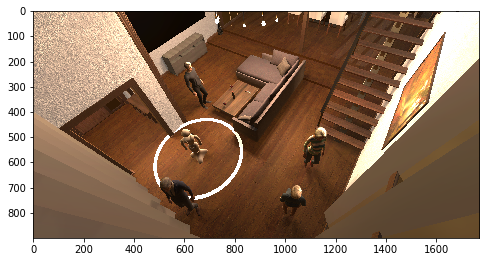

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       0.9514       |         1.256         |         0.148         |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.000000,2.552004
Mopping the floor,3.000000,2.684407
Carry warm food,3.777778,3.355673
Carry cold food,3.777778,3.439839
Carry drinks,3.777778,3.486880
"Carry small objects (plates, toys)",3.666667,3.601728
"Carry big objects (tables, chairs)",2.666667,2.462482
Cleaning (Picking up stuff),3.444444,3.357486


Scene number: 918


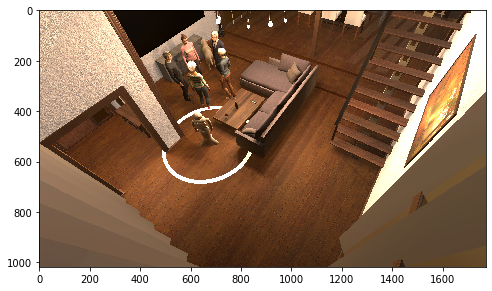

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.5871       |         1.463         |         0.1221        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,1.583333,2.220598
Mopping the floor,1.916667,2.193695
Carry warm food,3.333333,3.134888
Carry cold food,3.666667,3.239837
Carry drinks,3.750000,3.211661
"Carry small objects (plates, toys)",3.500000,3.358781
"Carry big objects (tables, chairs)",2.250000,2.330898
Cleaning (Picking up stuff),3.500000,3.121746


Scene number: 682


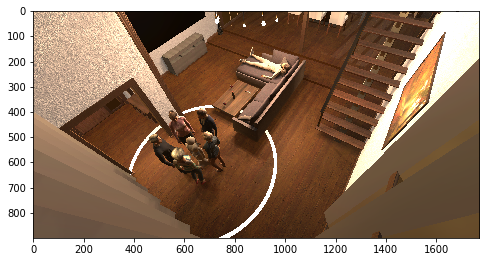

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.8984       |         1.359         |         0.2189        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,1.642857,1.756303
Mopping the floor,1.642857,1.956625
Carry warm food,3.214286,3.324912
Carry cold food,3.285714,3.475474
Carry drinks,3.285714,3.542638
"Carry small objects (plates, toys)",2.785714,3.346185
"Carry big objects (tables, chairs)",1.857143,1.863199
Cleaning (Picking up stuff),2.285714,2.588324


Scene number: 556


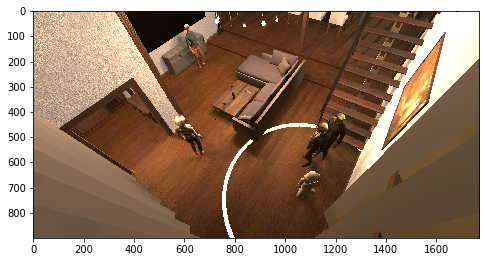

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.5032       |         1.258         |         0.1535        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.307692,2.418725
Mopping the floor,2.076923,2.534068
Carry warm food,3.384615,3.534137
Carry cold food,3.384615,3.493990
Carry drinks,3.384615,3.621356
"Carry small objects (plates, toys)",3.384615,3.663058
"Carry big objects (tables, chairs)",2.384615,2.430747
Cleaning (Picking up stuff),3.461538,3.381475


Scene number: 644


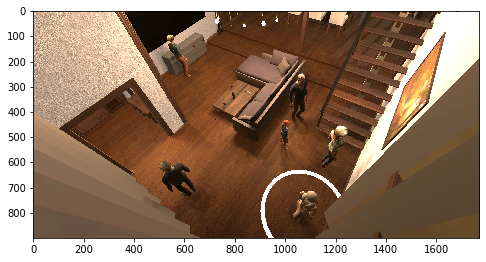

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.2596       |         1.2216        |         0.1414        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.923077,2.491028
Mopping the floor,2.538462,2.509717
Carry warm food,2.615385,3.026392
Carry cold food,3.076923,3.309680
Carry drinks,3.000000,3.296479
"Carry small objects (plates, toys)",3.615385,3.330488
"Carry big objects (tables, chairs)",2.307692,2.321263
Cleaning (Picking up stuff),3.923077,3.413572


Scene number: 283


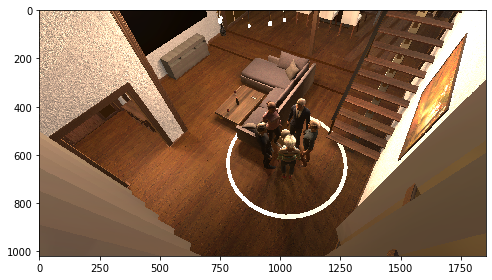

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.9273       |         1.4025        |         0.1924        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,1.722222,2.083529
Mopping the floor,1.722222,2.201228
Carry warm food,2.333333,3.346755
Carry cold food,2.500000,3.317582
Carry drinks,2.666667,3.459204
"Carry small objects (plates, toys)",2.388889,3.330957
"Carry big objects (tables, chairs)",1.722222,2.053139
Cleaning (Picking up stuff),2.166667,2.764363


Scene number: 296


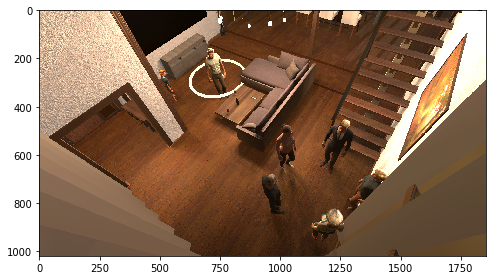

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.5542       |         1.3583        |         0.2098        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,1.761905,1.924655
Mopping the floor,1.857143,2.128566
Carry warm food,2.809524,2.982239
Carry cold food,3.095238,3.605606
Carry drinks,3.047619,3.372886
"Carry small objects (plates, toys)",2.904762,3.324165
"Carry big objects (tables, chairs)",1.761905,2.145448
Cleaning (Picking up stuff),3.333333,3.132740


Scene number: 783


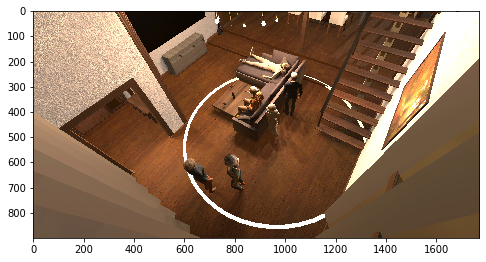

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.519        |         1.3366        |         0.1868        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.933333,2.373363
Mopping the floor,3.000000,2.476220
Carry warm food,3.666667,3.549097
Carry cold food,3.933333,3.613604
Carry drinks,4.133333,3.780773
"Carry small objects (plates, toys)",3.800000,3.397245
"Carry big objects (tables, chairs)",2.800000,2.304579
Cleaning (Picking up stuff),3.200000,3.319637


Scene number: 705


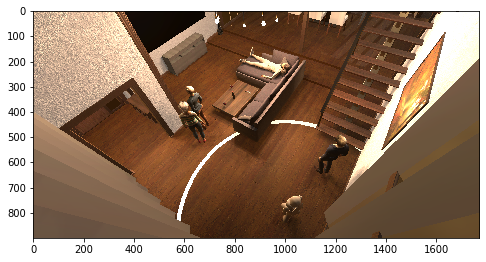

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.0821       |         1.2815        |         0.1463        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.733333,2.495536
Mopping the floor,2.600000,2.654413
Carry warm food,3.466667,3.552109
Carry cold food,3.533333,3.574801
Carry drinks,3.466667,3.732674
"Carry small objects (plates, toys)",3.533333,3.660389
"Carry big objects (tables, chairs)",2.333333,2.454830
Cleaning (Picking up stuff),3.800000,3.441571


Scene number: 826


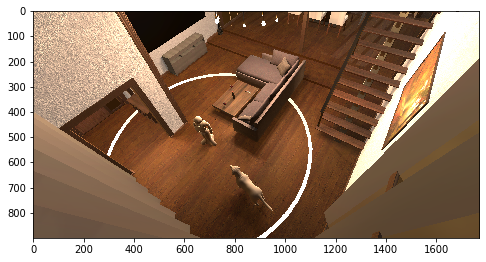

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.1497       |         1.6005        |         0.2819        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.714286,4.210129
Mopping the floor,3.714286,4.001608
Carry warm food,3.000000,3.351152
Carry cold food,3.285714,3.325823
Carry drinks,3.071429,3.300498
"Carry small objects (plates, toys)",3.714286,3.852432
"Carry big objects (tables, chairs)",3.214286,3.689953
Cleaning (Picking up stuff),4.285714,4.107071


Scene number: 833


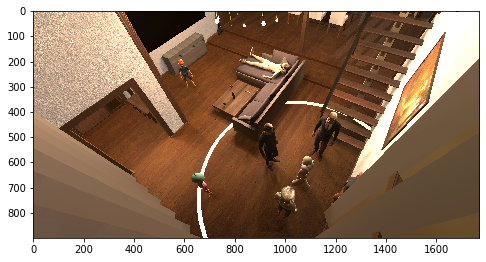

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.358        |         1.3492        |         0.2105        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.083333,1.765411
Mopping the floor,2.250000,1.891756
Carry warm food,2.750000,2.919282
Carry cold food,3.083333,3.359236
Carry drinks,3.083333,3.266588
"Carry small objects (plates, toys)",3.166667,3.026366
"Carry big objects (tables, chairs)",2.083333,1.733581
Cleaning (Picking up stuff),2.833333,2.641339


Scene number: 372


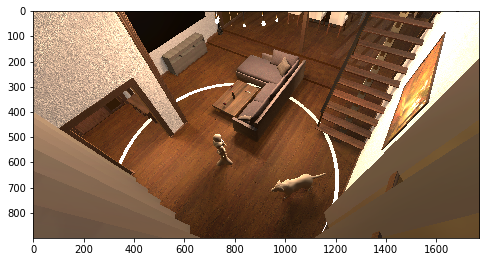

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.4183       |         1.6008        |         0.2824        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.071429,4.213922
Mopping the floor,3.428571,4.001949
Carry warm food,2.142857,3.356739
Carry cold food,2.285714,3.331994
Carry drinks,2.214286,3.307200
"Carry small objects (plates, toys)",3.928571,3.854561
"Carry big objects (tables, chairs)",2.928571,3.691161
Cleaning (Picking up stuff),3.785714,4.108816


Scene number: 275


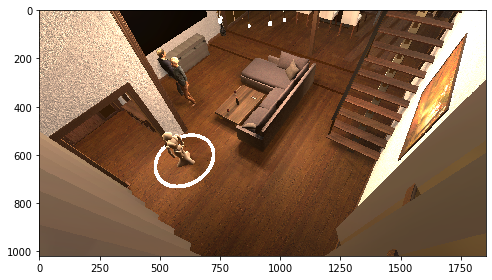

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.1133       |         1.2604        |         0.1625        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,4.000000,3.132261
Mopping the floor,4.105263,3.197450
Carry warm food,4.105263,3.550225
Carry cold food,4.105263,3.524770
Carry drinks,4.052632,3.662913
"Carry small objects (plates, toys)",4.157895,3.789298
"Carry big objects (tables, chairs)",4.052632,2.822048
Cleaning (Picking up stuff),4.157895,3.894736


Scene number: 897


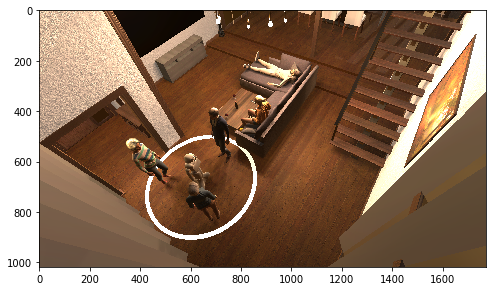

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       0.9886       |         1.3473        |         0.183         |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,1.583333,1.664258
Mopping the floor,1.666667,1.659784
Carry warm food,3.833333,2.712434
Carry cold food,3.833333,3.038281
Carry drinks,3.750000,3.141900
"Carry small objects (plates, toys)",3.750000,2.966229
"Carry big objects (tables, chairs)",1.333333,1.760429
Cleaning (Picking up stuff),3.416667,2.369584


Scene number: 837


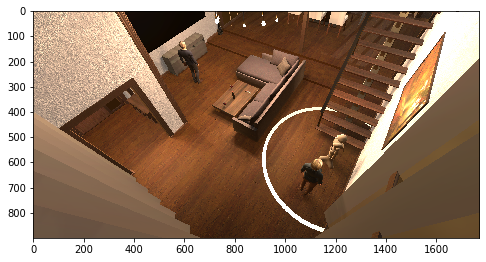

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.4265       |         1.2955        |         0.1859        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.785714,3.077368
Mopping the floor,2.857143,3.113557
Carry warm food,3.357143,3.456275
Carry cold food,3.357143,3.480525
Carry drinks,3.357143,3.502172
"Carry small objects (plates, toys)",3.428571,3.654957
"Carry big objects (tables, chairs)",2.214286,2.739798
Cleaning (Picking up stuff),3.714286,3.481598


Scene number: 747


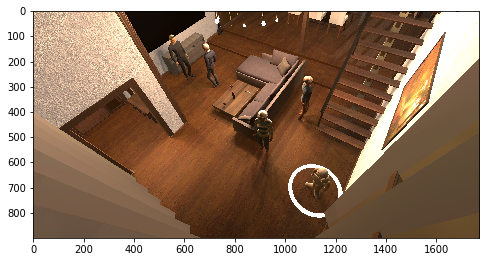

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.0737       |          1.25         |         0.1301        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.384615,2.521132
Mopping the floor,3.461538,2.639596
Carry warm food,3.692308,3.389960
Carry cold food,3.692308,3.311086
Carry drinks,3.846154,3.433735
"Carry small objects (plates, toys)",3.538462,3.544366
"Carry big objects (tables, chairs)",2.615385,2.472556
Cleaning (Picking up stuff),3.461538,3.615036


Scene number: 397


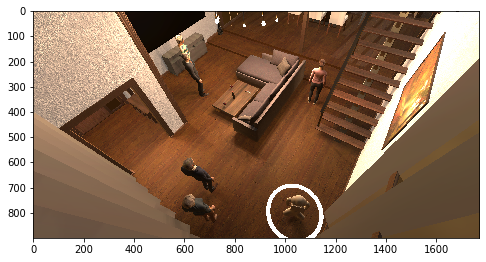

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       2.0593       |         1.2766        |         0.1401        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.461538,2.470446
Mopping the floor,2.692308,2.513124
Carry warm food,3.153846,3.343559
Carry cold food,3.153846,3.264120
Carry drinks,3.153846,3.320241
"Carry small objects (plates, toys)",3.384615,3.456445
"Carry big objects (tables, chairs)",2.692308,2.292934
Cleaning (Picking up stuff),3.692308,3.419633


Scene number: 339


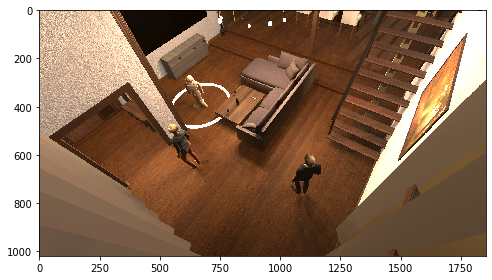

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.5735       |         1.3788        |         0.1894        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.214286,3.079957
Mopping the floor,3.642857,3.169095
Carry warm food,3.142857,3.367500
Carry cold food,3.142857,3.321705
Carry drinks,3.142857,3.399153
"Carry small objects (plates, toys)",3.785714,3.687369
"Carry big objects (tables, chairs)",2.857143,2.751521
Cleaning (Picking up stuff),3.714286,3.589896


Scene number: 329


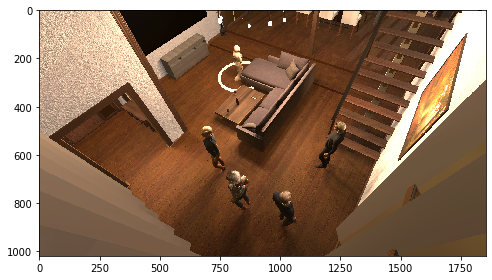

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.1954       |         1.2361        |         0.1458        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.806452,2.340698
Mopping the floor,3.000000,2.459021
Carry warm food,2.935484,3.397724
Carry cold food,3.000000,3.330882
Carry drinks,3.032258,3.429524
"Carry small objects (plates, toys)",3.225806,3.499501
"Carry big objects (tables, chairs)",2.290323,2.355961
Cleaning (Picking up stuff),3.774194,3.346013


Scene number: 786


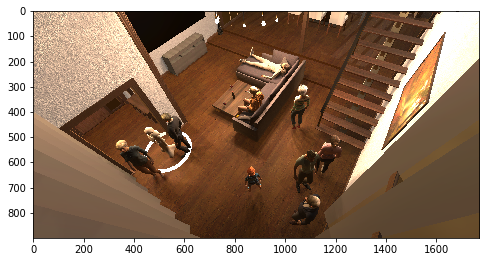

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.1923       |         1.2708        |         0.2034        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.285714,2.164176
Mopping the floor,2.142857,2.191559
Carry warm food,3.000000,2.957028
Carry cold food,3.357143,3.380711
Carry drinks,3.357143,3.371479
"Carry small objects (plates, toys)",3.285714,3.402783
"Carry big objects (tables, chairs)",2.071429,1.760427
Cleaning (Picking up stuff),2.642857,3.019700


Scene number: 919


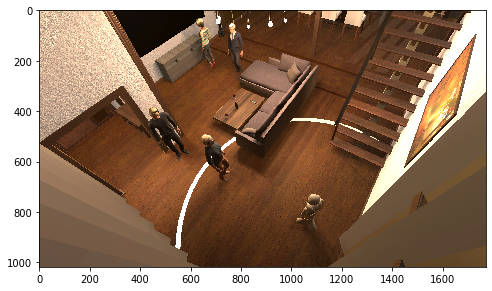

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.176        |         1.2556        |         0.2246        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.1250,2.545274
Mopping the floor,3.0625,2.550910
Carry warm food,3.8125,3.450938
Carry cold food,3.9375,3.858872
Carry drinks,3.8750,3.856429
"Carry small objects (plates, toys)",4.0625,3.827383
"Carry big objects (tables, chairs)",3.3125,2.416050
Cleaning (Picking up stuff),4.0625,3.343021


Scene number: 530


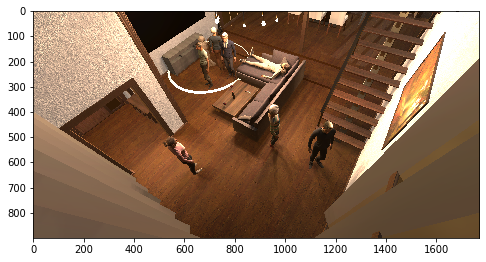

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.7536       |         1.3245        |         0.1935        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.066667,2.401431
Mopping the floor,2.000000,2.510610
Carry warm food,2.666667,3.579059
Carry cold food,2.933333,3.417381
Carry drinks,2.933333,3.750836
"Carry small objects (plates, toys)",2.733333,3.584112
"Carry big objects (tables, chairs)",2.066667,2.290781
Cleaning (Picking up stuff),2.200000,3.358102


Scene number: 475


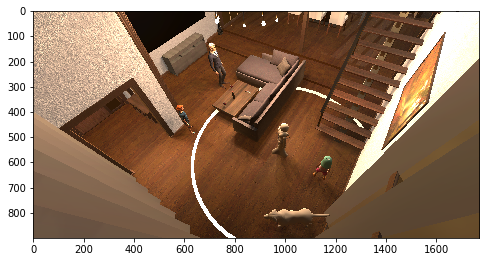

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.3477       |         1.3854        |         0.1562        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.181818,2.390373
Mopping the floor,2.909091,2.407426
Carry warm food,2.545455,2.889812
Carry cold food,3.090909,3.140930
Carry drinks,2.818182,2.994422
"Carry small objects (plates, toys)",3.363636,3.442703
"Carry big objects (tables, chairs)",2.090909,2.126395
Cleaning (Picking up stuff),3.636364,3.294667


Scene number: 524


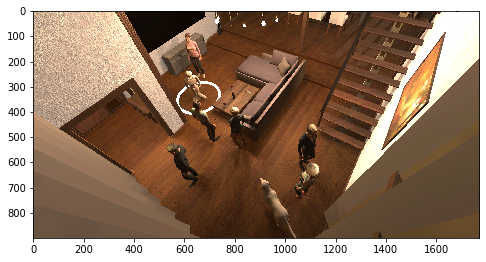

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.421        |         1.3828        |         0.2256        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.235294,2.270975
Mopping the floor,2.176471,2.414543
Carry warm food,3.294118,3.110982
Carry cold food,3.352941,3.249661
Carry drinks,3.411765,3.414696
"Carry small objects (plates, toys)",3.470588,3.324226
"Carry big objects (tables, chairs)",2.294118,1.994714
Cleaning (Picking up stuff),3.235294,3.218373


Scene number: 631


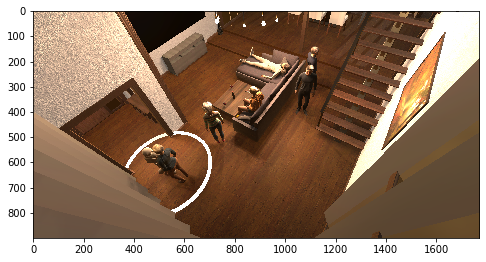

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.0431       |         1.2413        |         0.179         |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.2,2.344880
Mopping the floor,2.2,2.300763
Carry warm food,2.3,3.346698
Carry cold food,2.5,3.453617
Carry drinks,2.3,3.618780
"Carry small objects (plates, toys)",2.8,3.382088
"Carry big objects (tables, chairs)",2.0,2.202862
Cleaning (Picking up stuff),2.8,3.177469


Scene number: 544


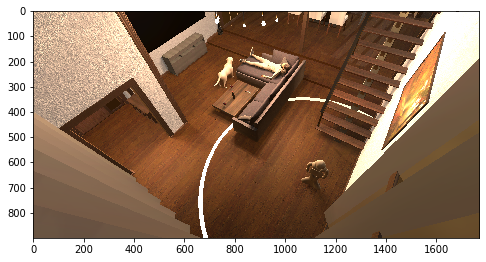

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.5496       |         1.478         |         0.2452        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.117647,3.503539
Mopping the floor,3.117647,3.646671
Carry warm food,3.235294,3.289172
Carry cold food,3.588235,3.405585
Carry drinks,3.411765,3.660469
"Carry small objects (plates, toys)",3.411765,4.016303
"Carry big objects (tables, chairs)",2.823529,3.146933
Cleaning (Picking up stuff),4.058824,4.217652


Scene number: 287


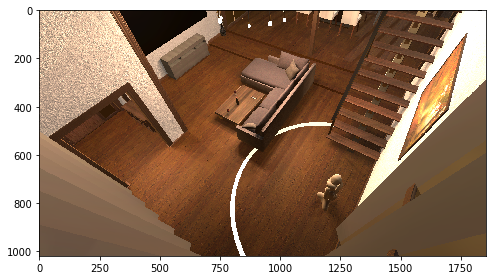

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.8162       |         1.5831        |         0.2622        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,4.764706,4.368670
Mopping the floor,4.764706,4.193926
Carry warm food,4.000000,3.534984
Carry cold food,4.235294,3.334109
Carry drinks,4.176471,3.463021
"Carry small objects (plates, toys)",4.294118,4.057186
"Carry big objects (tables, chairs)",4.529412,3.842109
Cleaning (Picking up stuff),4.764706,4.244762


Scene number: 537


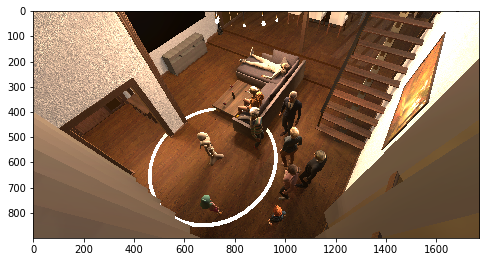

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.6044       |         1.3531        |         0.1772        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.214286,1.972679
Mopping the floor,2.285714,1.971832
Carry warm food,2.785714,2.900757
Carry cold food,2.857143,3.214782
Carry drinks,2.857143,3.381217
"Carry small objects (plates, toys)",2.857143,3.279694
"Carry big objects (tables, chairs)",2.071429,1.773152
Cleaning (Picking up stuff),2.357143,2.789912


Scene number: 700


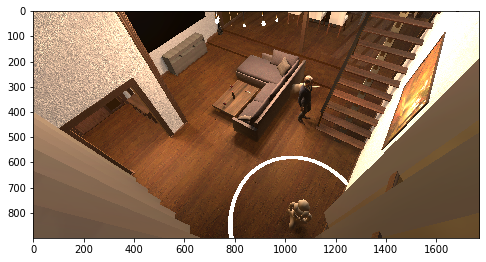

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.5505       |         1.4213        |         0.2397        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.8750,3.238326
Mopping the floor,3.8750,3.409579
Carry warm food,2.9375,3.185653
Carry cold food,3.0000,3.112474
Carry drinks,3.0625,3.237253
"Carry small objects (plates, toys)",3.5625,3.556326
"Carry big objects (tables, chairs)",2.6250,2.743466
Cleaning (Picking up stuff),3.7500,3.695390


Scene number: 531


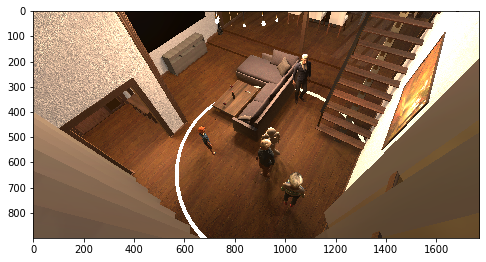

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.1758       |         1.342         |         0.1831        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.357143,2.479719
Mopping the floor,2.428571,2.480754
Carry warm food,3.214286,2.916918
Carry cold food,3.285714,3.425609
Carry drinks,3.214286,3.428982
"Carry small objects (plates, toys)",3.357143,3.238703
"Carry big objects (tables, chairs)",2.285714,2.189712
Cleaning (Picking up stuff),3.000000,3.186911


Scene number: 297


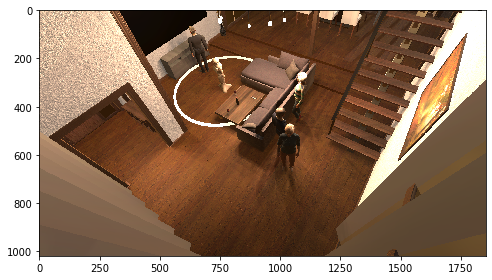

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.3714       |         1.2481        |         0.1341        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.45,2.621763
Mopping the floor,2.65,2.707458
Carry warm food,3.10,3.493490
Carry cold food,3.10,3.459424
Carry drinks,3.10,3.625399
"Carry small objects (plates, toys)",3.10,3.627292
"Carry big objects (tables, chairs)",2.65,2.521795
Cleaning (Picking up stuff),3.80,3.647305


Scene number: 706


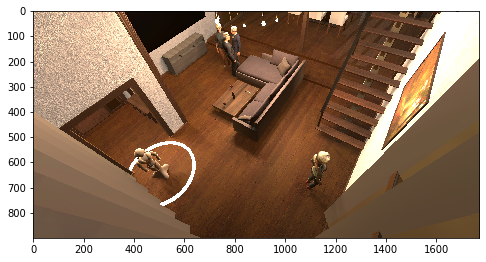

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.6603       |         1.2477        |         0.1297        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.000000,2.524210
Mopping the floor,3.153846,2.652889
Carry warm food,2.923077,3.428541
Carry cold food,2.923077,3.359389
Carry drinks,3.076923,3.462147
"Carry small objects (plates, toys)",3.076923,3.541901
"Carry big objects (tables, chairs)",2.923077,2.468868
Cleaning (Picking up stuff),3.384615,3.564759


Scene number: 974


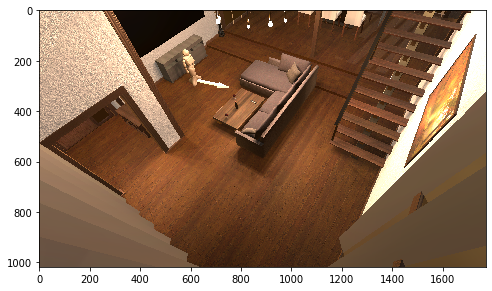

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.5071       |         1.5885        |         0.2577        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,4.533333,4.443236
Mopping the floor,4.533333,4.385091
Carry warm food,3.800000,3.346037
Carry cold food,3.800000,3.620497
Carry drinks,3.800000,3.373045
"Carry small objects (plates, toys)",4.400000,4.007628
"Carry big objects (tables, chairs)",4.266667,3.845731
Starting conversation,2.400000,2.292758


Scene number: 795


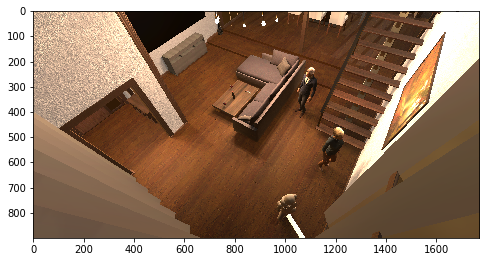

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       2.3736       |         1.3776        |         0.1872        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.071429,3.141227
Mopping the floor,3.000000,3.360796
Carry warm food,3.571429,3.258313
Carry cold food,3.785714,3.585931
Carry drinks,3.714286,3.334054
"Carry small objects (plates, toys)",3.642857,3.553098
"Carry big objects (tables, chairs)",3.142857,2.882041
Starting conversation,2.785714,2.937860


Scene number: 277


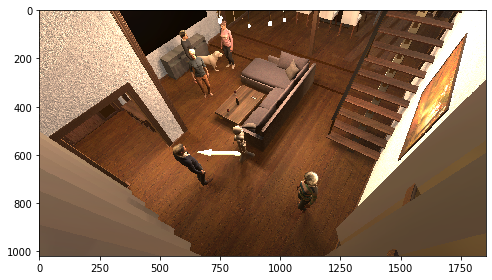

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.6067       |         1.3665        |         0.1691        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.263158,2.668684
Mopping the floor,3.000000,2.448052
Carry warm food,3.263158,2.702721
Carry cold food,3.368421,3.072529
Carry drinks,3.315789,3.002024
"Carry small objects (plates, toys)",3.526316,2.996385
"Carry big objects (tables, chairs)",2.947368,2.111058
Starting conversation,3.894737,2.962769


Scene number: 978


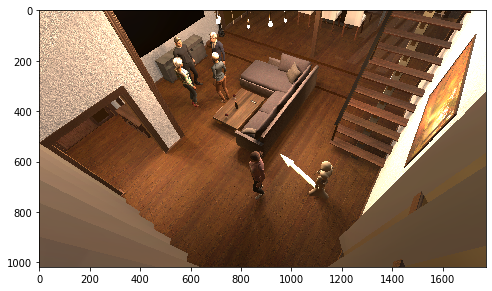

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.1988       |         1.3063        |         0.1728        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.266667,2.381588
Mopping the floor,2.333333,2.322299
Carry warm food,3.866667,3.447913
Carry cold food,3.933333,3.591614
Carry drinks,3.933333,3.555079
"Carry small objects (plates, toys)",3.866667,3.537079
"Carry big objects (tables, chairs)",2.333333,2.264454
Starting conversation,3.333333,3.185984


Scene number: 720


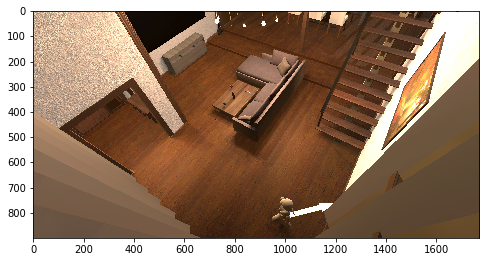

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.7411       |         1.5885        |         0.2577        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.714286,4.443236
Mopping the floor,3.857143,4.385091
Carry warm food,2.857143,3.346037
Carry cold food,3.000000,3.620497
Carry drinks,2.857143,3.373045
"Carry small objects (plates, toys)",3.357143,4.007628
"Carry big objects (tables, chairs)",2.928571,3.845731
Starting conversation,2.928571,2.292758


Scene number: 950


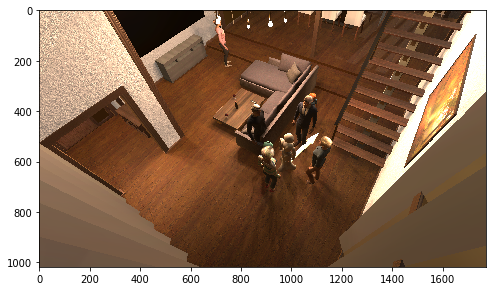

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.3393       |         1.4576        |         0.1947        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,1.200000,2.190515
Mopping the floor,1.200000,2.065936
Carry warm food,2.800000,3.119607
Carry cold food,3.066667,3.340992
Carry drinks,3.066667,3.271764
"Carry small objects (plates, toys)",3.000000,3.333182
"Carry big objects (tables, chairs)",1.333333,2.153651
Starting conversation,3.600000,3.143156


Scene number: 772


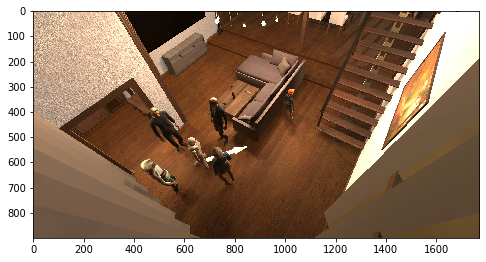

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.0114       |         1.3593        |         0.1854        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.000000,1.902689
Mopping the floor,1.916667,1.934562
Carry warm food,2.666667,2.772699
Carry cold food,3.083333,3.143275
Carry drinks,3.166667,2.999114
"Carry small objects (plates, toys)",2.916667,2.871854
"Carry big objects (tables, chairs)",1.500000,1.925561
Starting conversation,3.583333,3.149026


Scene number: 820


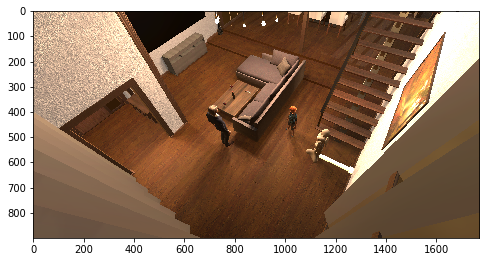

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.4776       |         1.3363        |         0.1723        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,4.230769,3.024483
Mopping the floor,4.230769,3.159776
Carry warm food,3.230769,3.129505
Carry cold food,3.153846,3.291613
Carry drinks,3.230769,3.039091
"Carry small objects (plates, toys)",3.461538,3.319061
"Carry big objects (tables, chairs)",3.076923,2.687839
Starting conversation,2.307692,2.756277


Scene number: 693


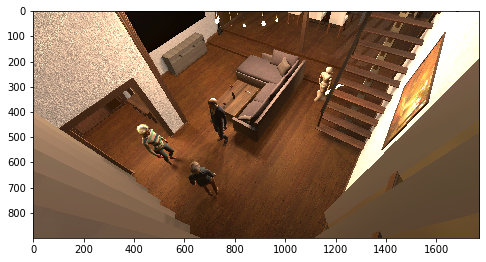

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.6405       |         1.3412        |         0.1234        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,3.733333,2.458301
Mopping the floor,4.133333,2.250456
Carry warm food,3.933333,3.150279
Carry cold food,3.933333,3.338960
Carry drinks,3.866667,3.383357
"Carry small objects (plates, toys)",3.733333,3.028550
"Carry big objects (tables, chairs)",3.733333,2.433716
Starting conversation,2.600000,2.533461


Scene number: 497


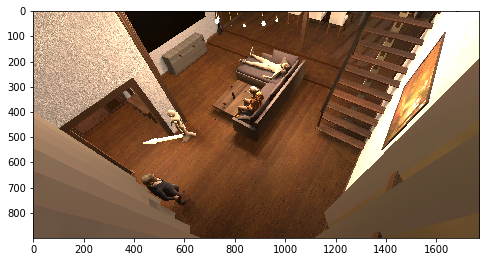

+--------------------+-----------------------+-----------------------+
| Variance in labels | Aleatoric uncertainty | Epistemic uncertainty |
+--------------------+-----------------------+-----------------------+
|       1.6172       |         1.3599        |         0.1752        |
+--------------------+-----------------------+-----------------------+


,Mean label,Predicted mean
Actions,,
Vacuum cleaning,2.1250,2.515771
Mopping the floor,2.4375,2.735811
Carry warm food,3.5000,3.289858
Carry cold food,3.6250,3.467357
Carry drinks,3.6875,3.364913
"Carry small objects (plates, toys)",3.6875,3.393395
"Carry big objects (tables, chairs)",2.5000,2.553924
Starting conversation,2.6250,2.870148


In [9]:
# Print evaluation along with image
counter = 0
for action_type in test_scenes:
    for scene_index, scene in enumerate(action_type):
        counter += 1
        if counter < 10:
            continue
        print('Scene number:', scene)
        # Print image
        if features.loc[features['Stamp'] == scene].empty:
            image_path = '/Users/jonastjomsland/Dissertation/' + features.loc[features['Stamp'] == str(scene)]['File Path'].values[0]
        else:
            image_path = '/Users/jonastjomsland/Dissertation/' + features.loc[features['Stamp'] == scene]['File Path'].values[0]
        img = plt.imread(image_path)
        plt.figure(figsize = (8,10))
        plt.rcParams["axes.grid"] = False
        imgplot = plt.imshow(img)
        plt.show()
        # Create dataframe to view results:
        #eval_df = pd.DataFrame(columns= ['Mean label', 'Variance in labels', 'Predicted mean', 'Aleatoric uncertainty', 'Epistemic uncertainty'])
        eval_df = pd.DataFrame(columns= ['Mean label', 'Predicted mean'])        
        for column in eval_df:
            eval_df[column] = evaluation_dict[scene][column]
        eval_df.index = evaluation_dict[scene]['Actions']
        eval_df.index.name = 'Actions'
        # Print average Epistemic and Aleatoric uncertainty
        table = PrettyTable()
        table.field_names = ['Variance in labels', 'Aleatoric uncertainty', 'Epistemic uncertainty']
        table.add_row([np.round(np.mean(evaluation_dict[scene]['Variance in labels']), 4), np.round(np.mean(evaluation_dict[scene]['Aleatoric uncertainty']),4), np.round(np.mean(evaluation_dict[scene]['Epistemic uncertainty']), 4)])
        print(table)
        # Display predictions
        display(eval_df)
        if counter > 50:
            counter = 0
            break